In [1]:
using Lux
using SciMLSensitivity
using DiffEqFlux
using DifferentialEquations
using Plots
using Zygote
using Random
rng = Random.seed!(1234)
using OptimizationOptimisers
using Statistics
using ComponentArrays
using CUDA
using BlockDiagonals
using Images
using Interpolations
ArrayType = CUDA.functional() ? CuArray : Array;
# Import our custom backend functions
include("coupling_functions/functions_example.jl")
include("coupling_functions/functions_NODE.jl")
include("coupling_functions/functions_loss.jl")
include("coupling_functions/functions_FDderivatives.jl");

## Gray-Scott model

In following examples we will use the GS model to discuss the effect of numerically approximating PDEs using finite differences.
We will also focus on the showcasing the strenght of trained CNODEs.

The system that we want to solve is the Gray-Scott model
\begin{equation}\begin{cases} \frac{du}{dt} = D_u \nabla u - uv^2 + f(1-u)  \equiv F_u(u,v) \\ \frac{dv}{dt} = D_v \nabla v + uv^2 - (f+k)v  \equiv G_v(u,v)\end{cases} \end{equation}
where $u(x,y,t):\mathbb{R}^2\times \mathbb{R}\rightarrow \mathbb{R}$ is the concentration of species 1, while $v(x,y,t)$ is the concentration of species two. This model reproduce the effect of the two species diffusing in their environment, and reacting together.
This effect is captured by the ratios between $D_u$ and $D_v$ (the diffusion coefficients) and $f$ and $k$ (the reaction rates).

First we create a grid to discretize the problem. Notice that in literature the coefficients are usually scaled such that $dx=dy=1$, so we will use this scaling to have a direct comparison with literature.

In [2]:
dux = duy = dvx = dvy = 1
nux = nuy = nvx = nvy = 100
grid = Grid(dux, duy, nux, nuy, dvx, dvy, nvx, nvy);

Here, we define the initial condition as a random perturbation over a constant background

In [3]:
function initial_condition(grid, U₀, V₀, ε_u, ε_v)
    u_init = U₀ .+ ε_u .* randn(grid.nux, grid.nuy)
    v_init = V₀ .+ ε_v .* randn(grid.nvx, grid.nvy)
    return u_init, v_init
end
U₀ = 0.5    # initial concentration of u
V₀ = 0.25   # initial concentration of v
ε_u = 0.05 # magnitude of the perturbation on u
ε_v = 0.05 # magnitude of the perturbation on v
u_initial, v_initial = initial_condition(grid, U₀, V₀, ε_u, ε_v);

However, we start with a simpler example of a central concentration of $v$

In [4]:
function initialize_uv(grid, u_bkg, v_bkg, center_size)
    u_initial = u_bkg*ones(grid.nux,grid.nuy)
    v_initial = 0*ones(grid.nvx,grid.nvy)
    v_initial[Int(grid.nvx/2-center_size):Int(grid.nvx/2+center_size),Int(grid.nvy/2-center_size):Int(grid.nvy/2+center_size)] .= v_bkg
    return u_initial, v_initial
end
u_initial, v_initial = initialize_uv(grid, 0.8, 0.9, 4);

We can now define the initial condition as a block diagonal matrix

In [5]:
uv0 = BlockDiagonal([u_initial, v_initial]);

From the literature, we have selected the following parameters in order to form nice patterns

In [6]:
D_u = 0.16
D_v = 0.08
f = 0.055
k = 0.062;

Here we (the user) define the **right hand sides** of the equations

In [7]:
F_u(u,v,grid) = D_u*Laplacian(u,grid.dux,grid.duy) .- u.*v.^2 .+ f.*(1.0.-u)
G_v(u,v,grid) = D_v*Laplacian(v,grid.dvx,grid.dvy) .+ u.*v.^2 .- (f+k).*v

G_v (generic function with 1 method)

Once the forces have been defined, we can create the CNODE
(Notice that atm we are not closing with the NNN, so it is not requried yet) [TO DO]

In [8]:
f_CNODE = create_f_CNODE(F_u, G_v, grid; is_closed=false);

and we ask Lux for the parameters to train and their structure [useless in this case]

In [9]:
θ, st = Lux.setup(rng, f_CNODE);

We now do a short *burnout run* to get rid of the initial artifacts

In [10]:
trange_burn = (0.0f0, 10.0f0)
dt, saveat = (1e-2, 1)
full_CNODE = NeuralODE(f_CNODE, trange_burn, Tsit5(), adaptive=false, dt=dt, saveat=saveat);
burnout_CNODE_solution = Array(full_CNODE(uv0, θ, st)[1]);

**CNODE run**
We use the output of the burnout to start a longer simulations

In [11]:
uv0 = burnout_CNODE_solution[:,:,end]
trange = (0.0f0, 8000.0f0)
dt, saveat = (1/(4*max(D_u,D_v)), 25)
full_CNODE = NeuralODE(f_CNODE, trange, Tsit5(), adaptive=false, dt=dt, saveat=saveat);
untrained_CNODE_solution = Array(full_CNODE(uv0, θ, st)[1])

200×200×321 Array{Float64, 3}:
[:, :, 1] =
 0.88461  0.88461  0.88461  0.88461  0.88461  …  0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461  …  0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 0.88461  0.88461  0.88461  0.88461  0.88461     0.0           0.0
 ⋮                                            ⋱                
 0.0      0.0      0.0      0.0      0.0         1.92601e-111  6.68565e-113
 0.0      0.0      0.0      0.0      0.0         3.94296e-113  1.36873e-114
 0.0      0.0      0.0      0.0      0.0         7.87084e-115  2.73229e

And we unpack the solution (a blockmatrix) to get the two species from

In [12]:
u = untrained_CNODE_solution[1:end÷2,1:end÷2, :]
v = untrained_CNODE_solution[end÷2+1:end,end÷2+1:end, :]

100×100×321 Array{Float64, 3}:
[:, :, 1] =
 1.74453e-123  9.82594e-122  5.4133e-120   …  1.74453e-123  6.05662e-125
 9.82594e-122  5.53452e-120  3.04914e-118     9.82594e-122  3.41129e-123
 5.4133e-120   3.04914e-118  1.6799e-116      5.4133e-120   1.87931e-121
 2.91468e-118  1.64178e-116  9.04549e-115     2.91468e-118  1.01185e-119
 1.53294e-116  8.63495e-115  4.75759e-113     1.53294e-116  5.32159e-118
 7.87084e-115  4.4337e-113   2.44289e-111  …  7.87084e-115  2.73229e-116
 3.94296e-113  2.22115e-111  1.22385e-109     3.94296e-113  1.36873e-114
 1.92601e-111  1.08499e-109  5.9784e-108      1.92601e-111  6.68565e-113
 9.16738e-110  5.16444e-108  2.84574e-106     9.16738e-110  3.18214e-111
 4.24899e-108  2.39373e-106  1.31905e-104     4.24899e-108  1.47485e-109
 ⋮                                         ⋱                
 1.92601e-111  1.08499e-109  5.9784e-108      1.92601e-111  6.68565e-113
 3.94296e-113  2.22115e-111  1.22385e-109     3.94296e-113  1.36873e-114
 7.87084e-115  4.433

Plot the solution as an animation

┌ Info: Saved animation to /tmp/jl_PIREL45UBS.gif
└ @ Plots /home/simone/.julia/packages/Plots/HyyIK/src/animation.jl:156


┌ Info: Saved animation to /home/simone/Dropbox/eScience_projects/DEEPDIEP-repos/SciML-model-coupling/examples/plots/GS_coarse.gif
└ @ Plots /home/simone/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/home/simone/Dropbox/eScience_projects/DEEPDIEP-repos/SciML-model-coupling/examples/plots/GS_coarse.gif")
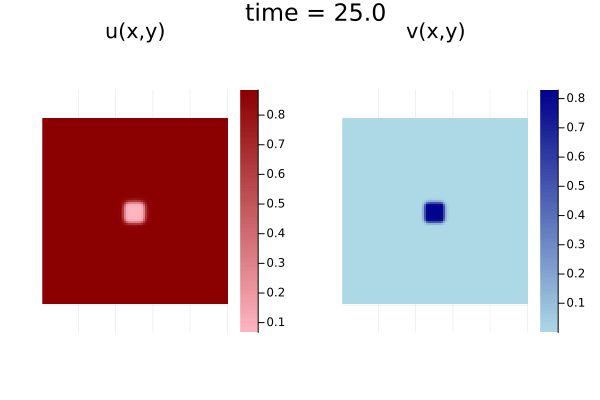

In [36]:
anim = Animation()
fig = plot(layout = (1, 2), size = (600, 300))
@gif for i in 1:size(u, 3)
    p1 = heatmap(u[:,:,i], axis=false, bar=true, aspect_ratio=1, color=:reds , title="u(x,y)")
    p2 = heatmap(v[:,:,i], axis=false, bar=true, aspect_ratio=1, color=:blues, title="v(x,y)")
    time = round(i*saveat, digits=0)
    fig = plot(p1, p2, layout=(1,2), plot_title="time = $(time)")
    frame(anim, fig)
end
if isdir("./plots")
    gif(anim, "./plots/GS_coarse.gif", fps=10)
else
    gif(anim, "examples/plots/GS.gif", fps=10)
end

### Errors induced by coarsening
We show now what happens if instead of the standard discretization `dx=dy=1`, we use a coarser one on the second species.
So now we redefine the grid parameters

In [14]:
nvx = nvy = 75
dvx = nux*dux/nvx
dvy = nuy*duy/nvy
coarse_grid = Grid(dux, duy, nux, nuy, dvx, dvy, nvx, nvy);

Once we have non matching grids, the forces have to match this new structure.
So we introduce a pre-processing step that converts the two species to be on the same grid.
Notice that we interpolate using the `Lanczos4OpenCV` method from `Interpolations.jl` and we decide to expand v to u in the first equation, and viceversa for the second equation.
The user is free to define the right hand side of the CNODE in the preferred way.
Here we do:

In [15]:
Fc_u(u,v, grid) = begin
    v_resized = imresize(v, (grid.nux,grid.nuy), method=Lanczos4OpenCV())
    F_u(u,v_resized, grid)
end
Gc_v(u,v, grid) = begin
    u_resized = imresize(u, (grid.nvx,grid.nvy), method=Lanczos4OpenCV())
    G_v(u_resized,v, grid)
end

Gc_v (generic function with 1 method)

So we can create the CNODE

In [16]:
f_coarse_CNODE = create_f_CNODE(Fc_u, Gc_v, coarse_grid; is_closed=false)
θ, st = Lux.setup(rng, f_coarse_CNODE);

For the initial condition, we take the finer grid after the burnout and filter the v component to the coarse grid.

In [17]:
uv0 = burnout_CNODE_solution[:,:,end]
u0b = uv0[1:end÷2,1:end÷2]
v0b = uv0[end÷2+1:end,end÷2+1:end]
v0_coarse = imresize(v0b, (coarse_grid.nvx,coarse_grid.nvy), method=Lanczos4OpenCV())
uv0_coarse = BlockDiagonal([u0b, v0_coarse]);

**CNODE run**

In [18]:
coarse_CNODE = NeuralODE(f_coarse_CNODE, trange, Tsit5(), adaptive=false, dt=dt, saveat=saveat)
coarse_CNODE_solution = Array(coarse_CNODE(uv0_coarse, θ, st)[1])
u_coarse = coarse_CNODE_solution[1:coarse_grid.nux,1:coarse_grid.nuy, :]
v_coarse = coarse_CNODE_solution[coarse_grid.nux+1:end,coarse_grid.nuy+1:end, :];

Compare the fine-fine solution with the fine-coarse solution

┌ Info: Saved animation to /tmp/jl_1cFiH63une.gif
└ @ Plots /home/simone/.julia/packages/Plots/HyyIK/src/animation.jl:156


┌ Info: Saved animation to /home/simone/Dropbox/eScience_projects/DEEPDIEP-repos/SciML-model-coupling/examples/plots/GS_coarse.gif
└ @ Plots /home/simone/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/home/simone/Dropbox/eScience_projects/DEEPDIEP-repos/SciML-model-coupling/examples/plots/GS_coarse.gif")
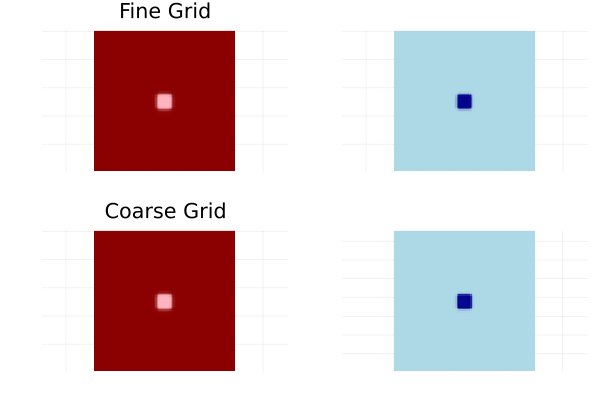

In [37]:
anim = Animation()
fig = plot(layout = (2, 2), size = (500, 500))
@gif for i in 1:size(u, 3)
    p1 = heatmap(u[:,:,i], axis=false, cbar=false, aspect_ratio=1, color=:reds )
    p2 = heatmap(v[:,:,i], axis=false, cbar=false, aspect_ratio=1, color=:blues)
    p3 = heatmap(u_coarse[:,:,i],axis=false, cbar=false, aspect_ratio=1, color=:reds )
    p4 = heatmap(v_coarse[:,:,i],axis=false, cbar=false, aspect_ratio=1, color=:blues)
    time = round(i*saveat, digits=2)
    fig = plot(p1, p2, p3, p4, layout=(2,2), title=["Fine Grid" "" "Coarse Grid" ""], title_location=:center)
    frame(anim, fig)
end
if isdir("./plots")
    gif(anim, "plots/GS_coarse.gif", fps=10)
else
    gif(anim, "examples/plots/GS_coarse.gif", fps=10)
end

From the figure, you can see that the coarser discretization of v has induced some artifacts that influences the whole dynamics. We will solve these artifacts using the Neural part of the CNODES.

[..Second part of the tutorial with CNODE training]

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*